In [ ]:
!pip install mne


In [ ]:
!pip install vtk

In [ ]:
!pip install pyvista

In [ ]:
!pip install autoreject

In [ ]:
!pip install h5io

In [ ]:
!pip install xgboost

In [19]:
!pip install mne-icalabel

Defaulting to user installation because normal site-packages is not writeable


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [3]:
!pip install lightgbm

Defaulting to user installation because normal site-packages is not writeable


In [1]:
import mne
from mne_icalabel import label_components
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

from sklearn.pipeline import Pipeline,make_pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import make_classification
from sklearn.ensemble import GradientBoostingClassifier
import lightgbm as lgb
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler,MinMaxScaler,LabelEncoder
from sklearn.model_selection import ShuffleSplit, cross_val_score, train_test_split,GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import shuffle
from mne import io, pick_types, read_events, Epochs, EvokedArray, create_info
from mne.preprocessing import Xdawn
from collections import OrderedDict
from mne.decoding import (SlidingEstimator, GeneralizingEstimator, Scaler,
                          cross_val_multiscore, LinearModel, get_coef,
                          Vectorizer, CSP)
from tensorflow import keras
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Dense, LeakyReLU
from tensorflow.keras.layers import Flatten, Activation, BatchNormalization
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras import layers
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Embedding
from tensorflow.keras.preprocessing import sequence


import glob
matplotlib.use('Qt5Agg')
mne.set_config('MNE_BROWSE_RAW_SIZE','20,20')
%matplotlib qt
mne.viz.set_3d_backend("notebook")
plt.rcParams["figure.figsize"] = [20,20]
mne.set_log_level('warning')

Using notebook 3d backend.



In [ ]:
#glob.glob('C:/Users/vs21542/EEG/ane_SD_EMG_1010/ane_SD_EMG_1010/*.vhdr')

In [2]:
raw_ec = mne.io.read_raw_brainvision('C:/Users/vs21542/EEG/ane_SD_EMG_1024/ane_SD_EMG_1024_awake_rest_ec.vhdr', preload=True)
#raw_ec = mne.io.read_raw_brainvision('D:/Vikas/Data Science/Dissertation/Dataset/Kongsberg_anesthesia_data/EEG/ane_SD_EMG_1010/ane_SD_EMG_1010_awake_rest_ec.vhdr', preload=True)

raw_eo = mne.io.read_raw_brainvision('C:/Users/vs21542/EEG/ane_SD_EMG_1024/ane_SD_EMG_1024_awake_rest_eo.vhdr', preload=True)
#raw_eo = mne.io.read_raw_brainvision('D:/Vikas/Data Science/Dissertation/Dataset/Kongsberg_anesthesia_data/EEG/ane_SD_EMG_1010/ane_SD_EMG_1010_awake_rest_eo.vhdr', preload=True)

raw_sed_1 = mne.io.read_raw_brainvision('C:/Users/vs21542/EEG/ane_SD_EMG_1024/ane_SD_EMG_1024_SED_1_rest.vhdr', preload=True)
#raw_sed_1 = mne.io.read_raw_brainvision('D:/Vikas/Data Science/Dissertation/Dataset/Kongsberg_anesthesia_data/EEG/ane_SD_EMG_1010/ane_SD_EMG_1010_sed_1.vhdr', preload=True)

raw_sed_2 = mne.io.read_raw_brainvision('C:/Users/vs21542/EEG/ane_SD_EMG_1024/ane_SD_EMG_1024_SED_2_rest.vhdr', preload=True)
#raw_sed_2 = mne.io.read_raw_brainvision('D:/Vikas/Data Science/Dissertation/Dataset/Kongsberg_anesthesia_data/EEG/ane_SD_EMG_1010/ane_SD_EMG_1010_sed_2.vhdr', preload=True)

#raw_sed_3 = mne.io.read_raw_brainvision('C:/Users/vs21542/EEG/ane_SD_EMG_1024/ane_SD_EMG_1024_SED_3_rest.vhdr', preload=True)
#raw_sed_3 = mne.io.read_raw_brainvision('D:/Vikas/Data Science/Dissertation/Dataset/Kongsberg_anesthesia_data/EEG/ane_SD_EMG_1010/ane_SD_EMG_1010_sed_3.vhdr', preload=True)

In [5]:
raw_eo.info

<Info | 7 non-empty values
 bads: []
 ch_names: Iz, O2, Oz, O1, PO8, PO4, POz, PO3, PO7, P8, P6, P4, P2, Pz, P1, ...
 chs: 65 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 1000.0 Hz
 meas_date: 2019-11-25 13:24:21 UTC
 nchan: 65
 projs: []
 sfreq: 5000.0 Hz
>

In [ ]:
raw_ec.info

In [ ]:
raw_sed_1.info

##### 1.) Sampling rate is 5000 Hz (i.e., EEG data were sampled 5000 times per second, so we have a data point every 2 ms)

##### 2.) The data were filtered during data collection between 0.00–1000 Hz. (from lowpass to highpass) 

In [ ]:
raw_eo_data = raw_eo.get_data()
print(raw_eo_data.shape)

In [ ]:
raw_eo.__dict__

In [ ]:
raw_ec.__dict__

In [ ]:
raw_sed_1.__dict__

In [3]:
# Marking EOG and EMG channels
raw_eo.set_channel_types({'VEOG': 'eog'})
raw_eo.set_channel_types({'HEOG': 'eog'})
raw_eo.set_channel_types({'EMG': 'emg'})

raw_ec.set_channel_types({'VEOG': 'eog'})
raw_ec.set_channel_types({'HEOG': 'eog'})
raw_ec.set_channel_types({'EMG': 'emg'})

raw_sed_1.set_channel_types({'VEOG': 'eog'})
raw_sed_1.set_channel_types({'HEOG': 'eog'})
raw_sed_1.set_channel_types({'EMG': 'emg'})

raw_sed_2.set_channel_types({'VEOG': 'eog'})
raw_sed_2.set_channel_types({'HEOG': 'eog'})
raw_sed_2.set_channel_types({'EMG': 'emg'})

# raw_sed_3.set_channel_types({'VEOG': 'eog'})
# raw_sed_3.set_channel_types({'HEOG': 'eog'})
# raw_sed_3.set_channel_types({'EMG': 'emg'})

<RawBrainVision | ane_SD_EMG_1024_SED_2_rest.eeg, 65 x 1508200 (301.6 s), ~748.0 MB, data loaded>

In [ ]:
# raw_eo.info['bads'] += ['VEOG','HEOG','EMG']
# raw_ec.info['bads'] += ['VEOG','HEOG','EMG']
# raw_sed_1.info['bads'] += ['VEOG','HEOG','EMG']
# raw_sed_2.info['bads'] += ['VEOG','HEOG','EMG']
# raw_sed_3.info['bads'] += ['VEOG','HEOG','EMG']  

In [9]:
print(raw_eo.plot(n_channels=62))

Figure(1440x1440)


In [ ]:
print(raw_ec.plot(n_channels=62))

In [ ]:
print(raw_sed_1.plot(n_channels=62))

In [ ]:
print(raw_sed_2.plot(n_channels=62))

In [ ]:
print(raw_sed_3.plot(n_channels=62))

In [ ]:
print(raw_eo.plot(start=10, duration=20, n_channels=65))

In [ ]:
print(raw_sed_2.plot(start=0, duration=5, n_channels=65, color='brown'))

In [ ]:
fig, ax = plt.subplots(figsize=[15, 5])
start_time = 15
end_time = 16

ax.plot(raw_sed_2.get_data(picks='CP1', tmin=start_time, tmax=end_time).T)
plt.show()

In [ ]:
raw_eo.info['ch_names']

In [ ]:
raw_sed_1.info['ch_names']

In [4]:
# EEG signals topography
montage_kind = "standard_1020"
montage =  mne.channels.make_standard_montage(montage_kind)
raw_eo.set_montage(montage, on_missing='ignore')
raw_ec.set_montage(montage, on_missing='ignore')
raw_sed_1.set_montage(montage, on_missing='ignore')
raw_sed_2.set_montage(montage, on_missing='ignore')
# raw_sed_3.set_montage(montage, on_missing='ignore')

<RawBrainVision | ane_SD_EMG_1024_SED_2_rest.eeg, 65 x 1508200 (301.6 s), ~748.0 MB, data loaded>

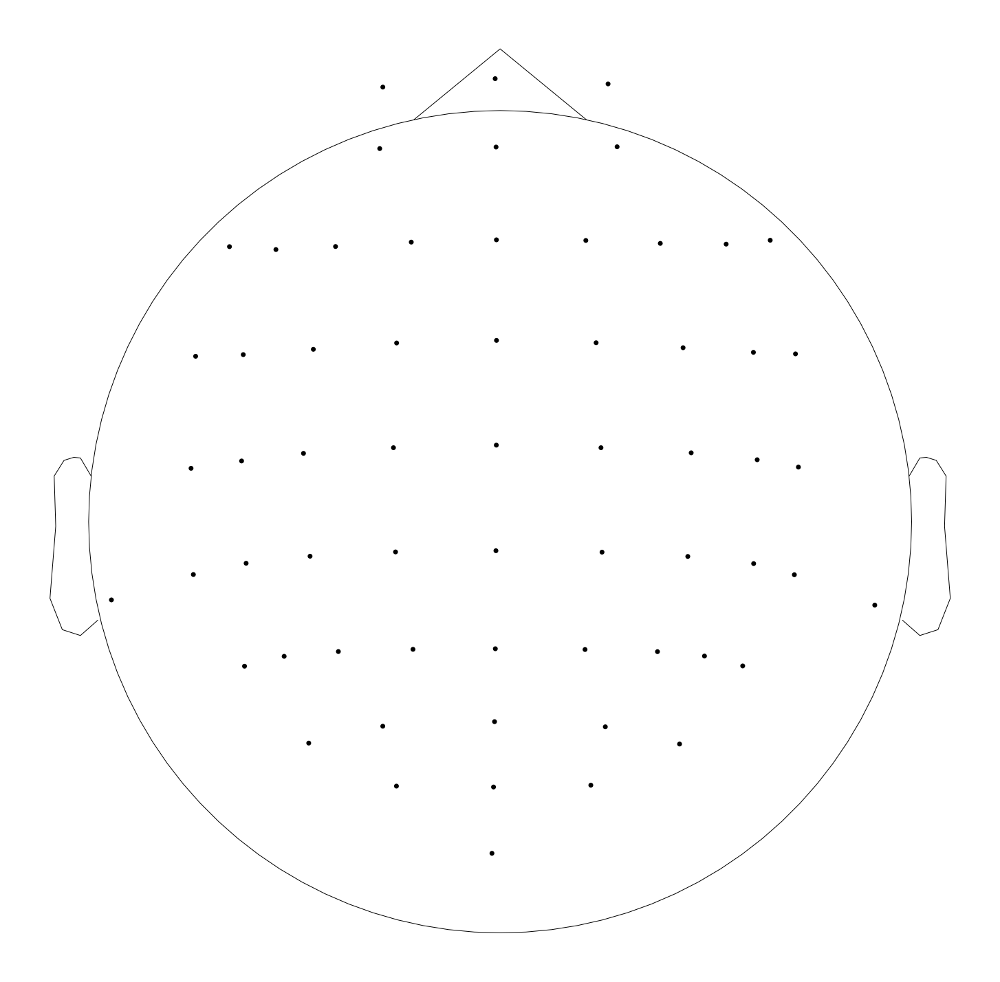

In [8]:
raw_sed_2.plot_sensors()

In [ ]:
raw_eo.info['bads']

In [ ]:
print("Eye Open Annotations : ", mne.events_from_annotations(raw_eo))
print("Eye Closed Annotations : ", mne.events_from_annotations(raw_ec))
print("Sed 1 Annotations : ", mne.events_from_annotations(raw_sed_1))
print("Sed 2 Annotations : ", mne.events_from_annotations(raw_sed_2))
print("Sed 3 Annotations : ", mne.events_from_annotations(raw_sed_3))

In [ ]:
events_eo, event_id_eo = mne.events_from_annotations(raw_eo)
mne.viz.plot_events(events_eo, event_id = event_id_eo, sfreq = raw_eo.info['sfreq'])

In [ ]:
events_ec, event_id_ec = mne.events_from_annotations(raw_ec)
mne.viz.plot_events(events_ec, event_id = event_id_ec, sfreq = raw_ec.info['sfreq'])

In [ ]:
events_sed_1, event_id_sed_1 = mne.events_from_annotations(raw_sed_1)
mne.viz.plot_events(events_sed_1, event_id = event_id_sed_1, sfreq = raw_sed_1.info['sfreq'])

In [ ]:
events_sed_2, event_id_sed_2 = mne.events_from_annotations(raw_sed_2)
mne.viz.plot_events(events_sed_2, event_id = event_id_sed_2, sfreq = raw_sed_2.info['sfreq'])

In [ ]:
events_sed_3, event_id_sed_3 = mne.events_from_annotations(raw_sed_3)
mne.viz.plot_events(events_sed_3, event_id = event_id_sed_3, sfreq = raw_sed_3.info['sfreq'])

In [ ]:
raw_eo.to_data_frame()

In [ ]:
fig, ax = plt.subplots(5)
raw_eo.plot_psd(ax = ax[0],
                area_mode='range', 
                fmin = 0.0,
                fmax = 100,
                show=False, 
                average=True)
raw_ec.plot_psd(ax = ax[1],
                area_mode='range', 
                fmin = 0.0,
                fmax = 100,
                show=False, 
                average=True)
raw_sed_1.plot_psd(ax = ax[2],
                area_mode='range', 
                fmin = 0.0,
                fmax = 100,
                show=False, 
                average=True)
raw_sed_2.plot_psd(ax = ax[3],
                area_mode='range', 
                fmin = 0.0,
                fmax = 100, 
                show=False, 
                average=True)
raw_sed_3.plot_psd(ax = ax[4],
                area_mode='range', 
                fmin = 0.0,
                fmax = 100, 
                show=False, 
                average=True)

ax[0].set_title("PSD for eye opened")
ax[1].set_title("PSD for eye closed")
ax[2].set_title("PSD for Sed 1")
ax[3].set_title("PSD for Sed 2")
ax[4].set_title("PSD for Sed 3")

fig.set_tight_layout(True)

In [10]:
# Applying downsampling of from sampling frequency 5000 Hz to 500 Hz.
raw_eo_downsampled = raw_eo.copy().resample(sfreq=500)
raw_ec_downsampled = raw_ec.copy().resample(sfreq=500)
raw_sed_1_downsampled = raw_sed_1.copy().resample(sfreq=500)
raw_sed_2_downsampled = raw_sed_2.copy().resample(sfreq=500) 
# raw_sed_3_downsampled = raw_sed_3.copy().resample(sfreq=500)

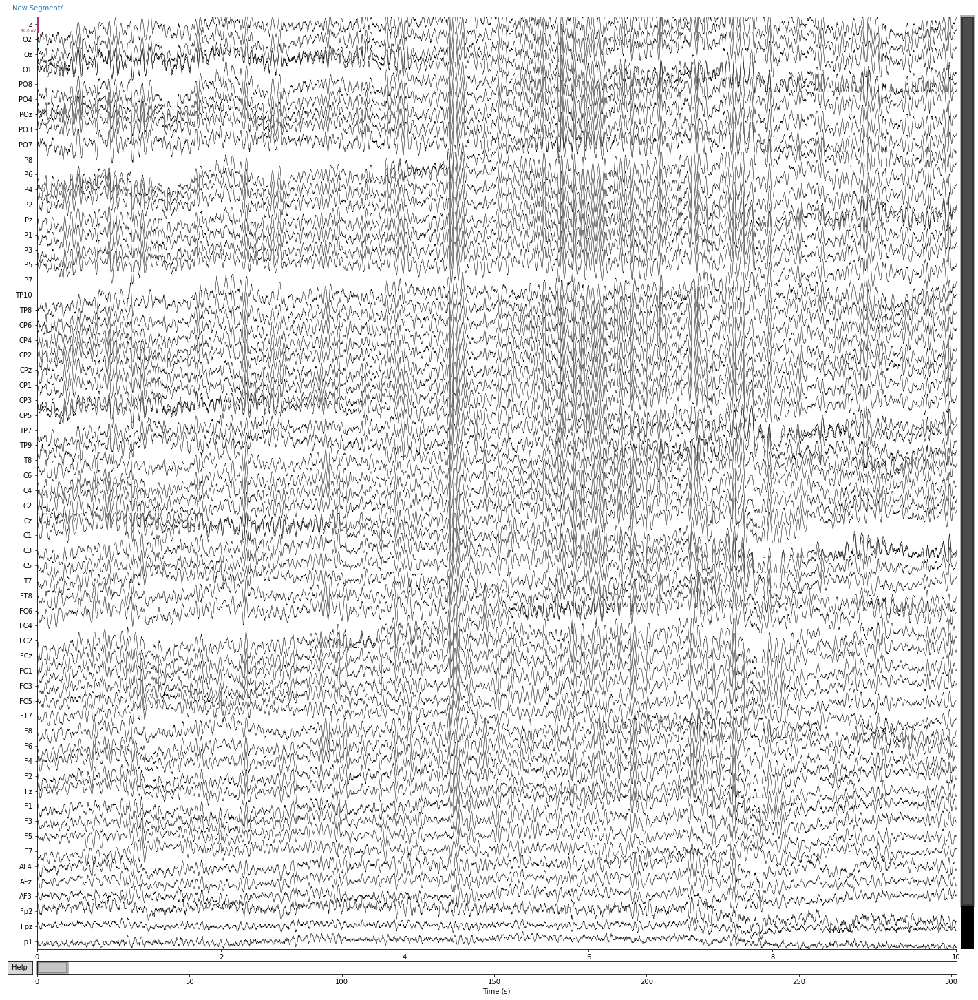

In [12]:
raw_eo_downsampled.plot(n_channels=62)
raw_ec_downsampled.plot(n_channels=62)
raw_sed_1_downsampled.plot(n_channels=62)
raw_sed_2_downsampled.plot(n_channels=62)
# raw_sed_3_downsampled.plot(n_channels=62)

In [13]:
#Method for Bandpass filter
def filter_raw_data(raw):
    low_cut = 0.1
    hi_cut  = 30
    raw_filt = raw.copy().filter(low_cut, hi_cut)
    return raw_filt

In [ ]:
def filter_psd(raw_filt):
    raw_filt.plot_psd(
                area_mode='range', 
                fmin = 0.0,
                fmax = 100,
                show=False, 
                average=True)

In [14]:
#Applying Bandpass filter on downsampled raw data
raw_eo_filt = filter_raw_data(raw_eo_downsampled)
raw_ec_filt = filter_raw_data(raw_ec_downsampled)
raw_sed_1_filt = filter_raw_data(raw_sed_1_downsampled)
raw_sed_2_filt = filter_raw_data(raw_sed_2_downsampled)
# raw_sed_3_filt = filter_raw_data(raw_sed_3_downsampled)

In [ ]:
filter_psd(raw_eo_filt)
filter_psd(raw_ec_filt)
filter_psd(raw_sed_1_filt)
filter_psd(raw_sed_2_filt)
# filter_psd(raw_sed_3_filt)

# Filtering in time domain

In [ ]:
raw_eo.plot(start=10, duration=20, n_channels=62)

In [ ]:
#raw_eo.save('D:/Vikas/Data Science/Dissertation/Dataset/Kongsberg_anesthesia_data/EEG/ane_SD_EMG_1016/' + '1016-raw_eo.fif', overwrite=True)

In [ ]:
raw_eo_filt.plot(start=10, duration=20, n_channels=62)

In [ ]:
raw_sed_1_filt.plot(start=15, duration=5, n_channels=62)

In [ ]:
#raw_eo_filt.save('D:/Vikas/Data Science/Dissertation/Dataset/Kongsberg_anesthesia_data/EEG/ane_SD_EMG_1016/' + '1016-filt-raw_eo.fif', overwrite=True)

In [16]:
def ica_raw_data(raw):
    ica_low_cut = 1.0       # For ICA, we filter out more low-frequency power
    ica_hi_cut  = 30
    raw_ica = raw.copy().filter(ica_low_cut, ica_hi_cut)
    return raw_ica

In [ ]:
raw_eo_ica = ica_raw_data(raw_eo_filt)
raw_ec_ica = ica_raw_data(raw_ec_filt)
raw_sed_1_ica = ica_raw_data(raw_sed_1_filt)
raw_sed_2_ica = ica_raw_data(raw_sed_2_filt)
raw_sed_3_ica = ica_raw_data(raw_sed_3_filt)

In [ ]:
#events_raw_eo_ica, events_raw_eo_ica_id = mne.events_from_annotations(raw_eo_filt)

In [ ]:
def ica_epoch_data(raw_data):    
# Break raw data into 1 s epochs
    t_step = 1.0
    events_raw_ica = mne.make_fixed_length_events(raw_data, duration = t_step)
    epochs_raw_ica = mne.Epochs(raw_data, events_raw_ica,
                        tmin=0.0, tmax=t_step,
                        preload=True,
                        baseline=None)
    return epochs_raw_ica

In [ ]:
raw_eo_ica_epoch = ica_epoch_data(raw_eo)
raw_ec_ica_epoch = ica_epoch_data(raw_ec)
raw_sed_1_ica_epoch = ica_epoch_data(raw_sed_1)
raw_sed_2_ica_epoch = ica_epoch_data(raw_sed_2)
raw_sed_3_ica_epoch = ica_epoch_data(raw_sed_3)

In [ ]:
raw_sed_1_ica_epoch = ica_epoch_data(raw_sed_1_filt)

In [ ]:
raw_eo_ica.plot()

In [ ]:
raw_ec_ica_epoch.plot()

In [ ]:
raw_sed_1_ica_epoch.plot()

In [ ]:
raw_sed_2_ica_epoch.plot()

In [ ]:
raw_sed_3_ica_epoch.plot()

In [ ]:
from autoreject import get_rejection_threshold
def reject_thres_epoch(epoch_data):
    reject = get_rejection_threshold(epoch_data)
    return reject

In [ ]:
reject_eo_thres = reject_thres_epoch(raw_eo_ica_epoch)
print("Reject threshold eye open ",reject_eo_thres)
reject_ec_thres = reject_thres_epoch(raw_ec_ica_epoch)
print("Reject threshold eye closed ",reject_ec_thres)
reject_sed_1_thres = reject_thres_epoch(raw_sed_1_ica_epoch)
print("Reject threshold eye sed 1 ",reject_sed_1_thres)
reject_sed_2_thres = reject_thres_epoch(raw_sed_2_ica_epoch)
print("Reject threshold eye sed 2 ",reject_sed_2_thres)
reject_sed_3_thres = reject_thres_epoch(raw_sed_3_ica_epoch)
print("Reject threshold eye sed 3 ",reject_sed_3_thres)

In [ ]:
# def fit_ica(epoch_raw_ica, reject):
#     # ICA parameters
#     random_state = 42   # ensures ICA is reproducable each time it's run
#     ica_n_components = .99     # Specify n_components as a decimal to set % explained variance
#     t_step = 1.0

#     # Fit ICA
#     ica = mne.preprocessing.ICA(n_components=ica_n_components,random_state=random_state)
#     ica.fit(epoch_raw_ica,reject=reject,tstep=t_step) 

In [ ]:
# fit_ica(raw_eo_ica_epoch,reject_eo_thres)

In [15]:
# Intializing the ICA parameters
random_state = 42 
ica_n_components = .99
t_step = 1.0

In [16]:
# Picking only eeg channels data
picks_eo = mne.pick_types(raw_eo_filt.info, meg=False, eeg=True, eog=False, emg=False, stim=False, exclude='bads')
picks_ec = mne.pick_types(raw_ec_filt.info, meg=False, eeg=True, eog=False, emg=False, stim=False, exclude='bads')
picks_sed_1 = mne.pick_types(raw_sed_1_filt.info, meg=False, eeg=True, eog=False, emg=False, stim=False, exclude='bads')
picks_sed_2 = mne.pick_types(raw_sed_2_filt.info, meg=False, eeg=True, eog=False, emg=False, stim=False, exclude='bads')
# picks_sed_3 = mne.pick_types(raw_sed_3_filt.info, meg=False, eeg=True, eog=False, emg=False, stim=False, exclude='bads')

In [17]:
# Fit ICA on eye open state data
ica_eo = mne.preprocessing.ICA(n_components=ica_n_components,random_state=random_state)
#ica_eo.fit(raw_eo_filt)
reconst_raw_eo = raw_eo_filt.copy()
ica_eo.fit(reconst_raw_eo, picks=picks_eo)

Method,fastica
Fit,14 iterations on raw data (153080 samples)
ICA components,8
Explained variance,99.0 %
Available PCA components,62
Channel types,eeg
ICA components marked for exclusion,—


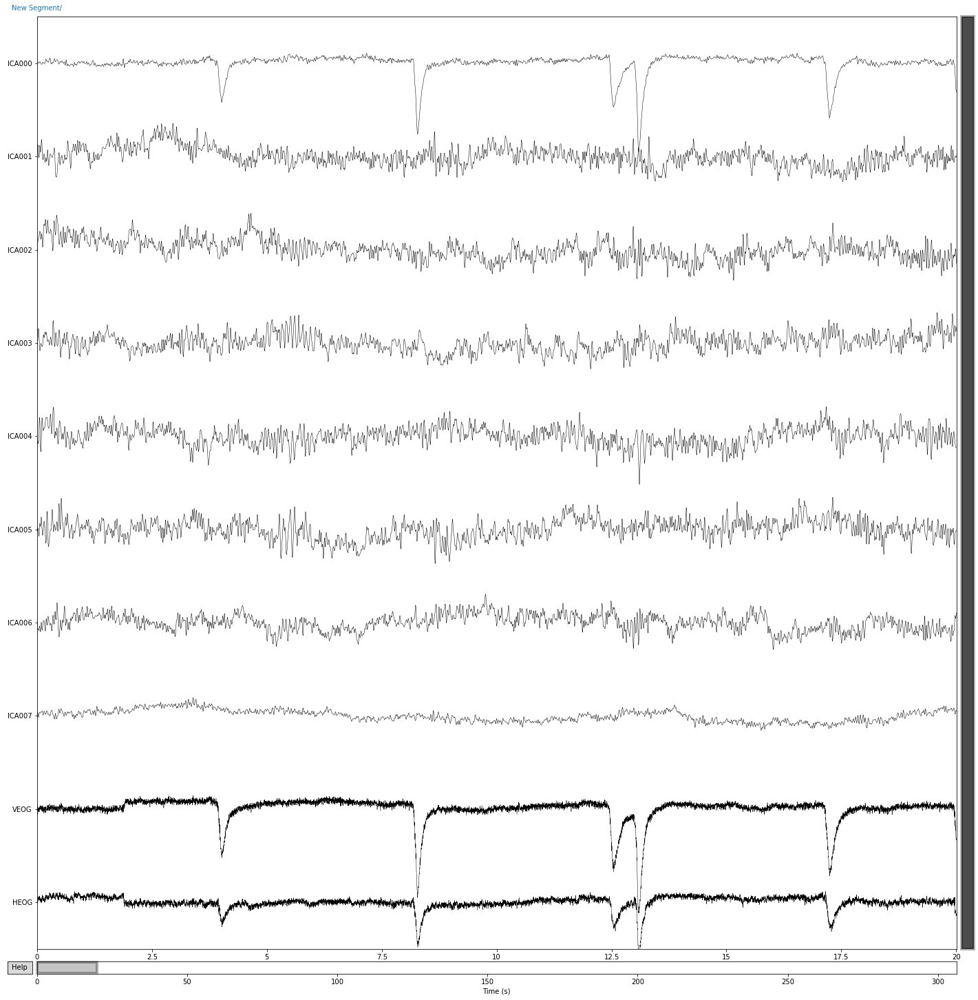

In [18]:
ica_eo.plot_sources(reconst_raw_eo)

In [19]:
from mne_icalabel import label_components
ica_comp_labels = label_components(reconst_raw_eo, ica_eo, method='iclabel')


In [20]:
ica_comp_labels

{'y_pred_proba': array([0.52332306, 0.8829645 , 0.9956335 , 0.99401337, 0.98013085,
        0.99519646, 0.72349906, 0.50490135], dtype=float32),
 'labels': ['heart beat',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'channel noise']}

In [23]:
ica_eo.exclude = []

for i, each in enumerate(ica_comp_labels['labels']):
    if (each =='eye blink') or (each.endswith('noise')):
        ica_eo.exclude.append(i)
ica_eo.exclude

[7]

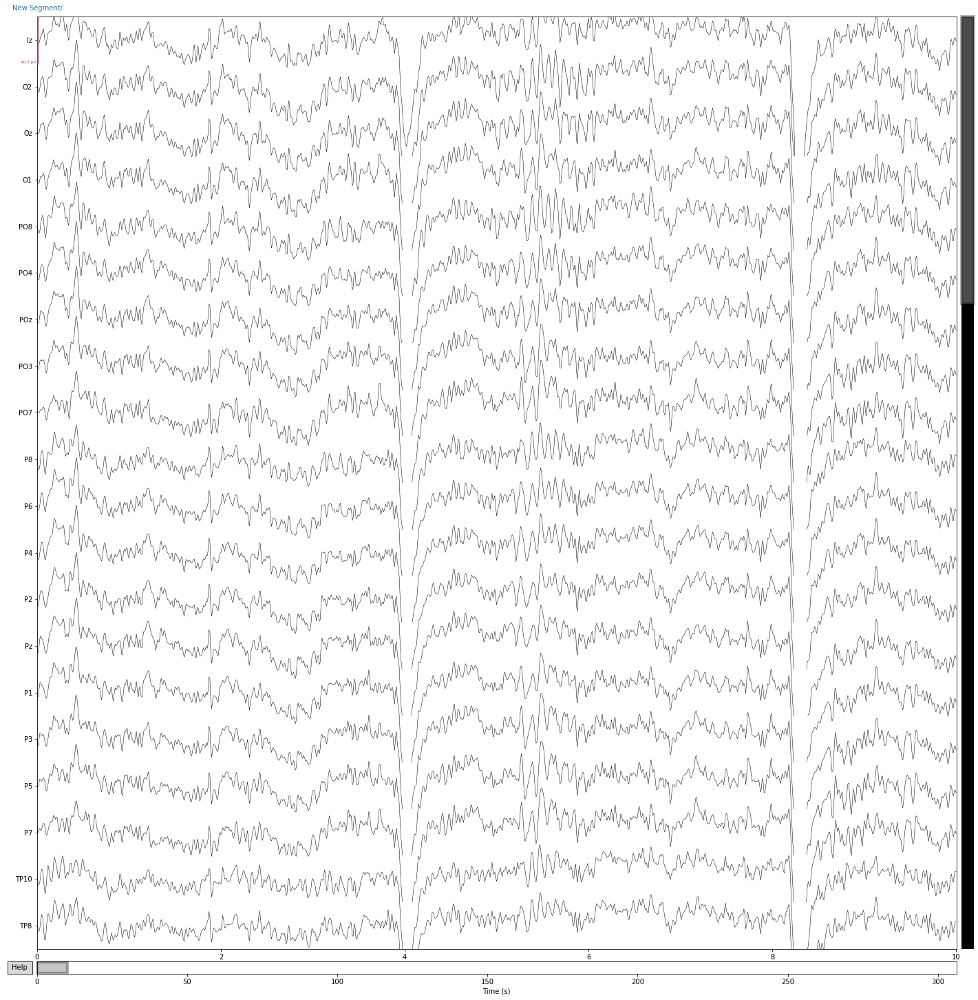

In [24]:
# Applying reconstructed data eye open state
ica_eo.apply(reconst_raw_eo, exclude = ica_eo.exclude).plot()

In [25]:
# Fit ICA on eye closed state
ica_ec = mne.preprocessing.ICA(n_components=ica_n_components,random_state=random_state)

reconst_raw_ec = raw_ec_filt.copy()

ica_ec.fit(reconst_raw_ec, picks=picks_ec)

Method,fastica
Fit,42 iterations on raw data (150600 samples)
ICA components,16
Explained variance,99.1 %
Available PCA components,62
Channel types,eeg
ICA components marked for exclusion,—


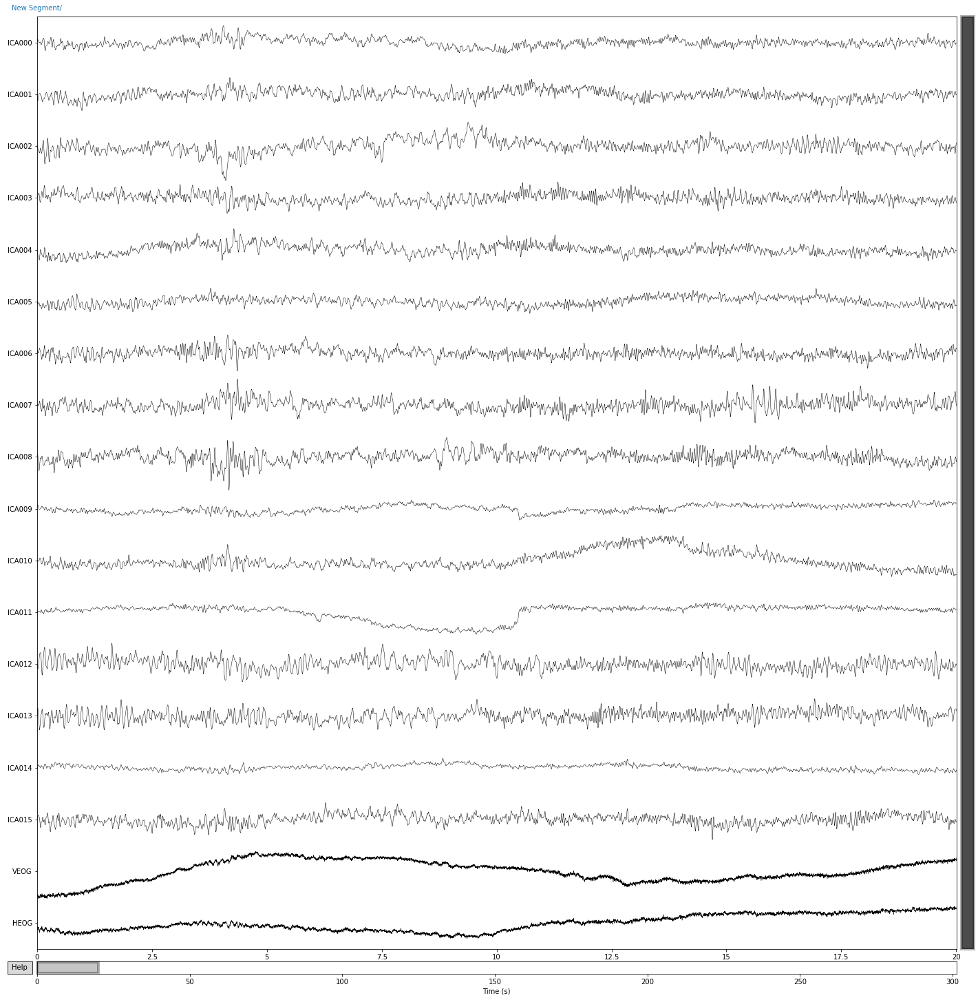

In [26]:
ica_ec.plot_sources(reconst_raw_ec)

In [27]:
ica_comp_labels_ec = label_components(reconst_raw_ec, ica_ec, method='iclabel')
ica_comp_labels_ec

{'y_pred_proba': array([0.6363199 , 0.612677  , 0.91470444, 0.99575216, 0.9863554 ,
        0.5424392 , 0.8315852 , 0.99132967, 0.99559754, 0.9007321 ,
        0.78281176, 0.48914284, 0.9986986 , 0.9911877 , 0.6702545 ,
        0.5050744 ], dtype=float32),
 'labels': ['other',
  'heart beat',
  'brain',
  'brain',
  'brain',
  'heart beat',
  'brain',
  'brain',
  'brain',
  'eye blink',
  'brain',
  'other',
  'brain',
  'brain',
  'other',
  'other']}

In [28]:
ica_ec.exclude = []

for i, each in enumerate(ica_comp_labels_ec['labels']):
    if (each =='eye blink') or (each.endswith('noise')):
        ica_ec.exclude.append(i)
        
ica_ec.exclude

[9]

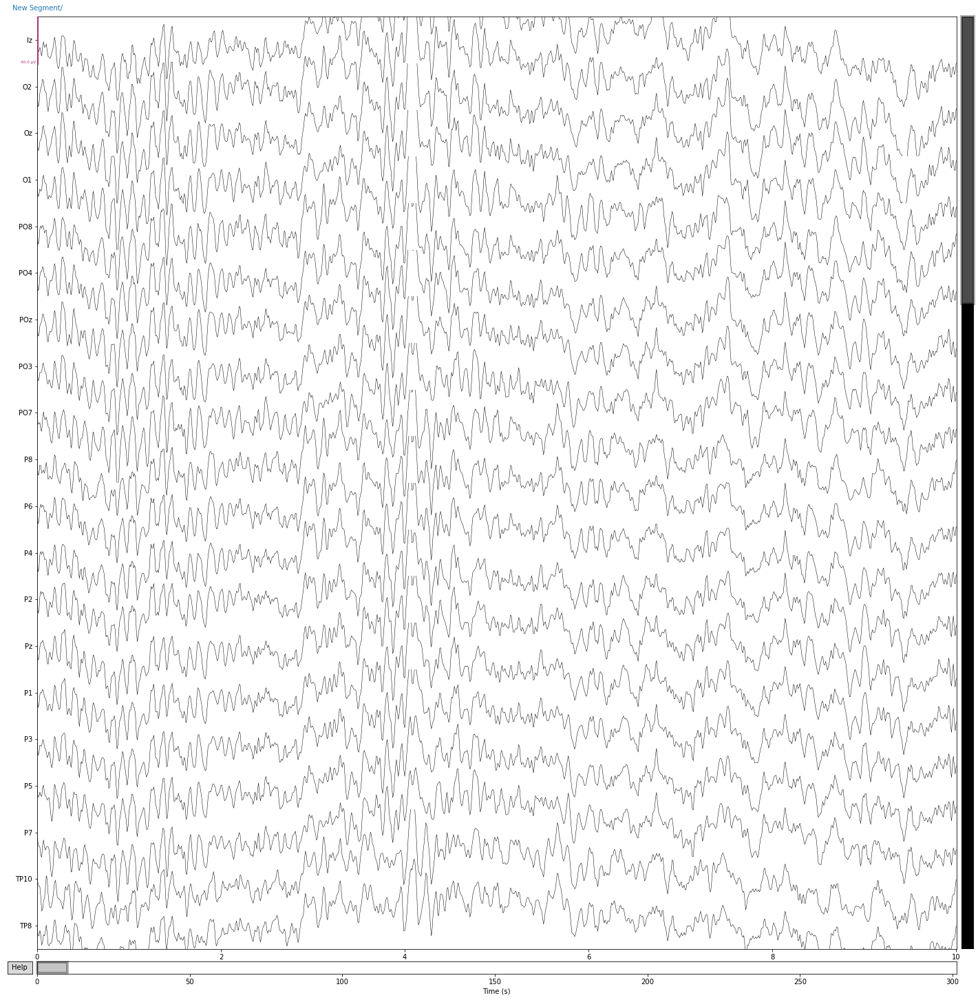

In [29]:
ica_ec.apply(reconst_raw_ec, exclude = ica_ec.exclude).plot()

In [ ]:
reconst_raw_ec.plot(n_channels = 62)

In [30]:
# Fit ICA on sedition 1 state data
ica_sed_1 = mne.preprocessing.ICA(n_components=ica_n_components,random_state=random_state)

reconst_raw_sed_1 = raw_sed_1_filt.copy()

ica_sed_1.fit(reconst_raw_sed_1, picks=picks_sed_1)

Method,fastica
Fit,43 iterations on raw data (150420 samples)
ICA components,16
Explained variance,99.1 %
Available PCA components,62
Channel types,eeg
ICA components marked for exclusion,—


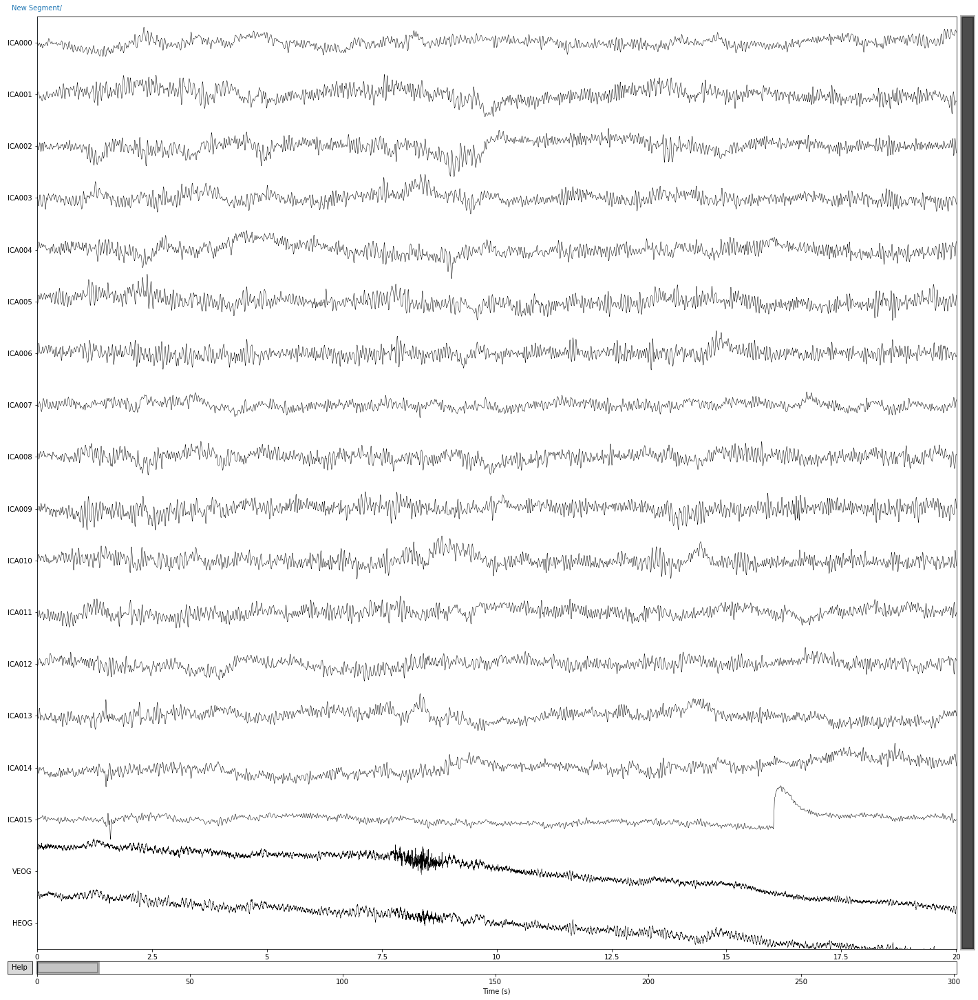

In [31]:
ica_sed_1.plot_sources(reconst_raw_sed_1)

In [32]:
ica_comp_labels_sed_1 = label_components(reconst_raw_sed_1, ica_sed_1, method='iclabel')
ica_comp_labels_sed_1

{'y_pred_proba': array([0.99863696, 0.98415244, 0.99908966, 0.8993433 , 0.9991603 ,
        0.99327993, 0.95550925, 0.96890235, 0.9997045 , 0.9995727 ,
        0.99826044, 0.9983796 , 0.99113715, 0.9187355 , 0.58954555,
        0.93693453], dtype=float32),
 'labels': ['brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'channel noise']}

In [33]:
ica_sed_1.exclude = []

for i, each in enumerate(ica_comp_labels_sed_1['labels']):
    if (each =='eye blink') or (each.endswith('noise')):
        ica_sed_1.exclude.append(i)
        
ica_sed_1.exclude

[15]

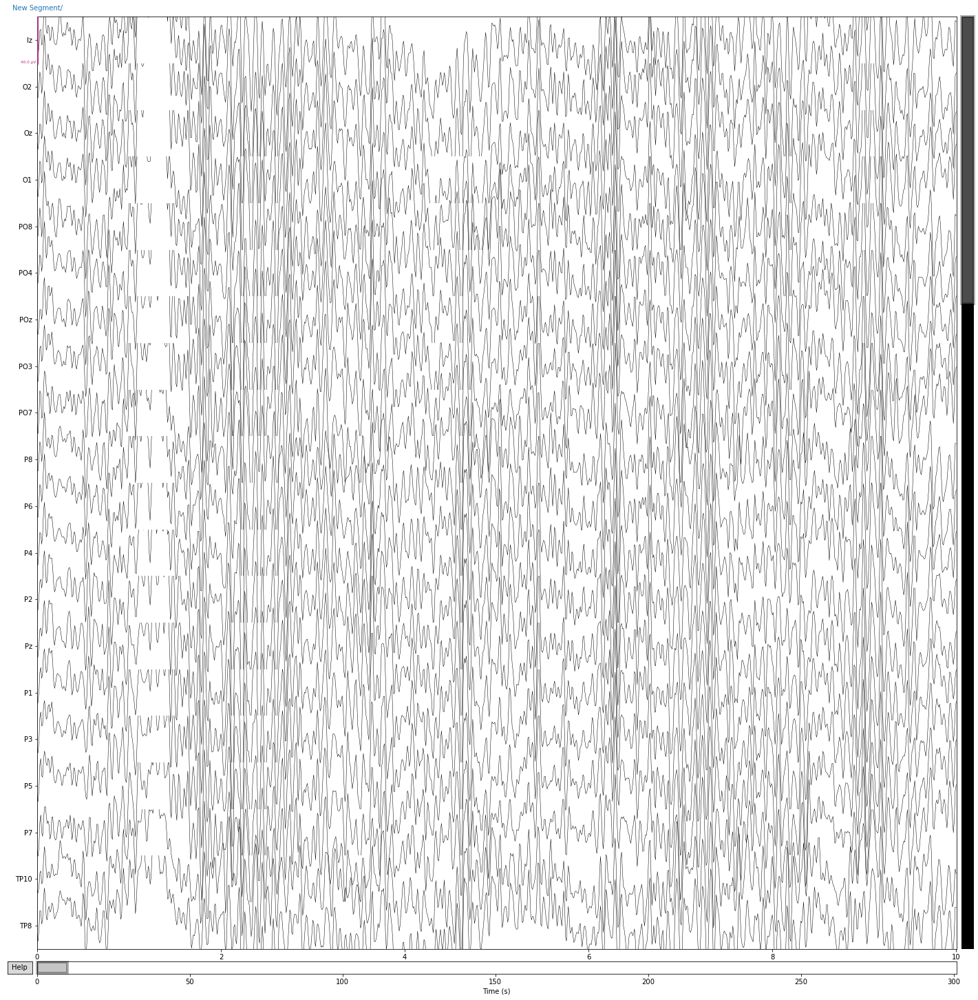

In [34]:
ica_sed_1.apply(reconst_raw_sed_1, exclude = ica_sed_1.exclude).plot()

In [ ]:
reconst_raw_sed_1.plot(n_channels = 62)

In [35]:
# Fit ICA for sedition 2 state
ica_sed_2 = mne.preprocessing.ICA(n_components=ica_n_components,random_state=random_state)

reconst_raw_sed_2 = raw_sed_2_filt.copy()

ica_sed_2.fit(reconst_raw_sed_2, picks=picks_sed_2)

Method,fastica
Fit,36 iterations on raw data (150820 samples)
ICA components,18
Explained variance,99.0 %
Available PCA components,62
Channel types,eeg
ICA components marked for exclusion,—


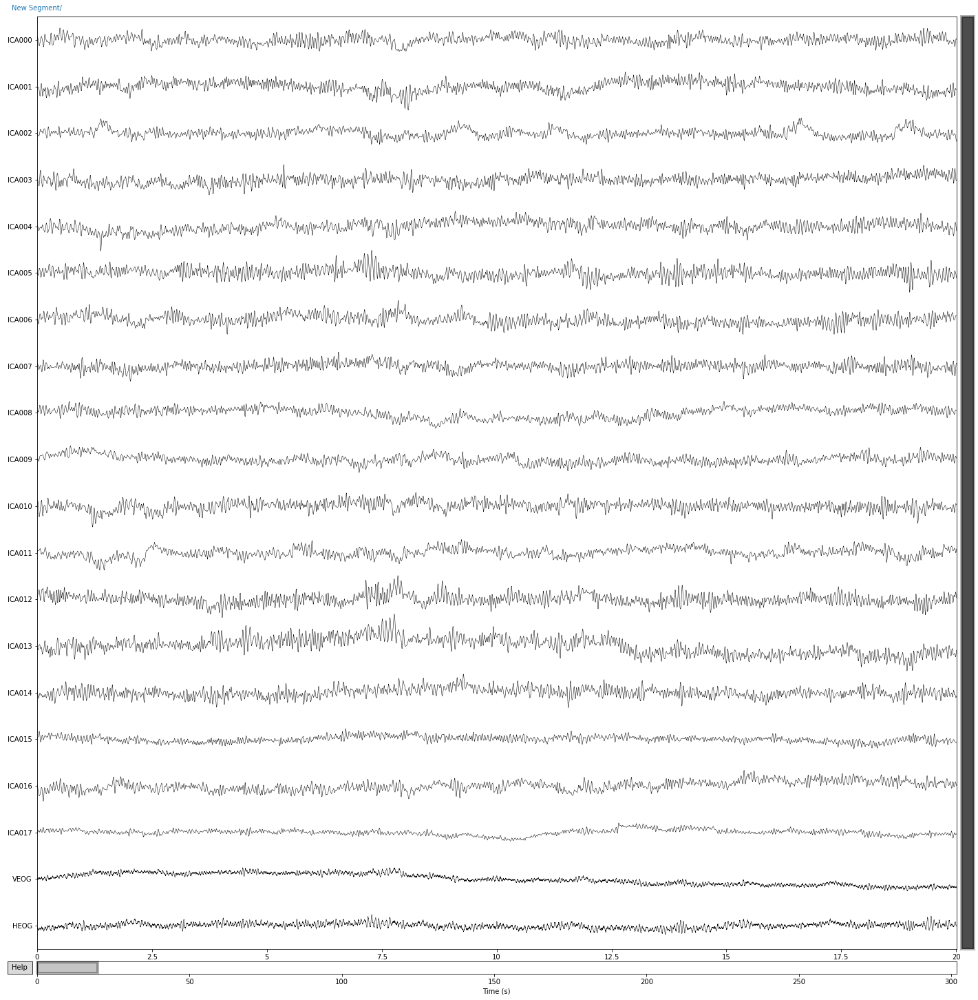

In [36]:
ica_sed_2.plot_sources(reconst_raw_sed_2)

In [37]:
ica_comp_labels_sed_2 = label_components(reconst_raw_sed_2, ica_sed_2, method='iclabel')
ica_comp_labels_sed_2

{'y_pred_proba': array([0.9997501 , 0.93839735, 0.9269755 , 0.89302254, 0.99959874,
        0.9728731 , 0.9973356 , 0.9989031 , 0.8741806 , 0.9988327 ,
        0.99987954, 0.9939269 , 0.9986819 , 0.7811606 , 0.94975317,
        0.67711437, 0.580476  , 0.62224334], dtype=float32),
 'labels': ['brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'brain',
  'other',
  'brain',
  'brain',
  'brain',
  'brain']}

In [38]:
ica_sed_2.exclude = []

for i, each in enumerate(ica_comp_labels_sed_2['labels']):
    if (each =='eye blink') or (each.endswith('noise')):
        ica_sed_2.exclude.append(i)
        
ica_sed_2.exclude

[]

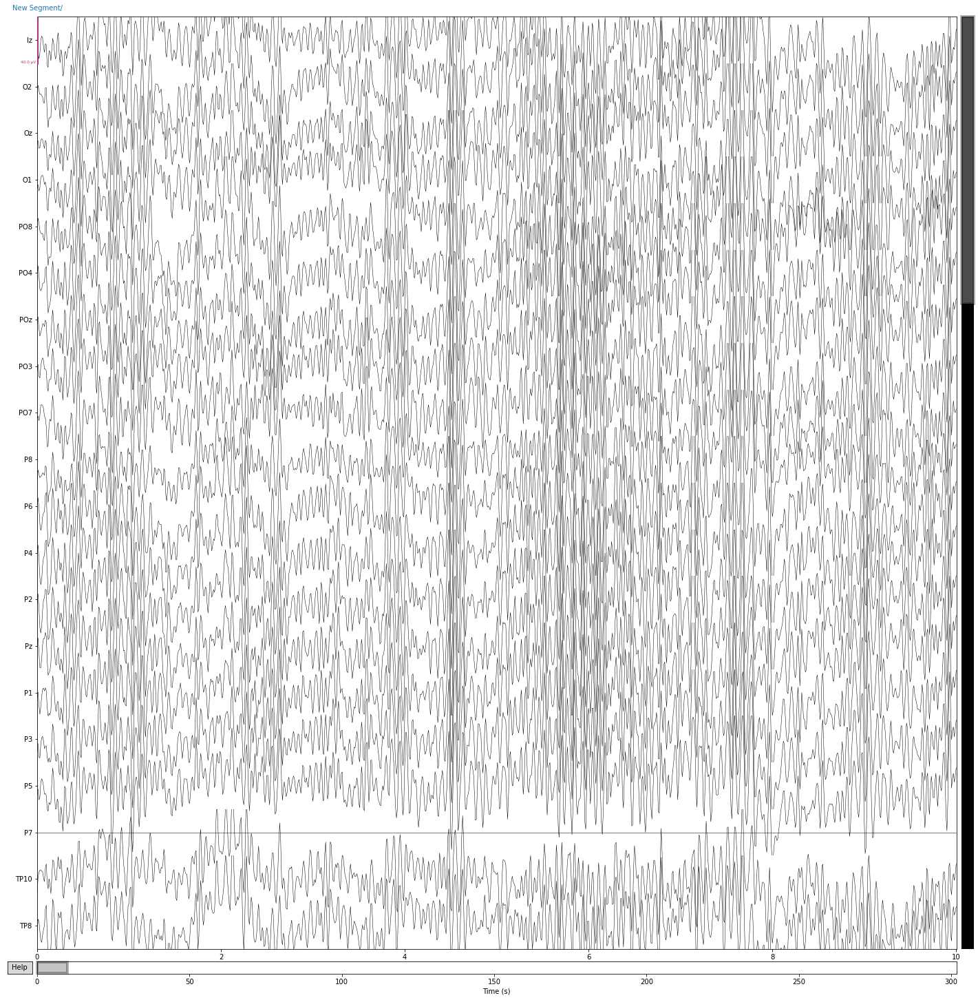

In [39]:
ica_sed_2.apply(reconst_raw_sed_2, exclude = ica_sed_2.exclude).plot()

In [ ]:
# # Fit ICA for sedition state 3 data
# ica_sed_3 = mne.preprocessing.ICA(n_components=ica_n_components,random_state=random_state)

# reconst_raw_sed_3 = raw_sed_3_filt.copy()

# ica_sed_3.fit(reconst_raw_sed_3, picks=picks_sed_3)

In [ ]:
# ica_sed_3.plot_sources(reconst_raw_sed_3)

In [40]:
# ica_sed_3.exclude = [0,1,3,5,9,13,14,15,16,17,18,19,24,25,26,27,29]

# # ica_sed_3.exclude

In [ ]:
ica_sed_3.apply(reconst_raw_sed_3, exclude = ica_sed_3.exclude).plot()

In [43]:
ica_eo.plot_components(outlines = 'skirt')

[<MNEFigure size 702x357.12 with 8 Axes>]

In [44]:
ica_ec.plot_components(outlines = 'skirt')

[<MNEFigure size 702x696.24 with 16 Axes>]

In [45]:
ica_sed_1.plot_components(outlines = 'skirt')

[<MNEFigure size 702x696.24 with 16 Axes>]

In [46]:
ica_sed_2.plot_components(outlines = 'skirt')

[<MNEFigure size 702x696.24 with 18 Axes>]

In [42]:
# ica_sed_3.plot_components(outlines = 'skirt')

In [ ]:
ica_hi_cut  = 30

In [ ]:
ica_eo.plot_properties(raw_eo_filt, picks=range(0, ica_eo.n_components_), psd_args={'fmax': ica_hi_cut});

In [ ]:
ica_ec.plot_properties(raw_ec_ica_epoch, picks=range(0, ica_ec.n_components_), psd_args={'fmax': ica_hi_cut});

In [ ]:
ica_sed_1.plot_properties(raw_sed_1_ica_epoch, picks=range(0, ica_sed_1.n_components_), psd_args={'fmax': ica_hi_cut});

In [ ]:
ica_sed_2.plot_properties(raw_sed_2_ica_epoch, picks=range(0, ica_sed_2.n_components_), psd_args={'fmax': ica_hi_cut});

In [ ]:
ica_sed_3.plot_properties(raw_sed_3_ica_epoch, picks=range(0, ica_sed_3.n_components_), psd_args={'fmax': ica_hi_cut});

In [ ]:
ica_z_thresh = 1.96 
eog_indices, eog_scores = ica_eo.find_bads_eog(reconst_raw_eo, ch_name=['VEOG', 'HEOG', 'EMG'], threshold=ica_z_thresh)
ica_eo.exclude = eog_indices

ica_eo.plot_scores(eog_scores)

In [ ]:
ica_eo.plot_sources(raw_eo_filt)

In [ ]:
ica_sed_1.plot_sources(raw_sed_1_filt)

In [ ]:
ica_eo.plot_properties(raw_eo_filt, picks=range(0, ica_eo.n_components_));

In [ ]:
ica_sed_1.exclude = []

# find which ICs match the EOG pattern
eog_indices, eog_scores = ica_sed_1.find_bads_eog(reconst_raw_sed_1)
ica_sed_1.exclude = eog_indices
ica_sed_1.exclude

In [ ]:
# barplot of ICA component "EOG match" scores
ica_eo.plot_scores(eog_scores)

In [ ]:
# barplot of ICA component "EOG match" scores
ica_sed_1.plot_scores(eog_scores)

In [ ]:
eog_indices, eog_scores = ica_eo.find_bads_eog(reconst_raw_eo, ch_name=['VEOG', 'HEOG'], threshold=ica_z_thresh)
ica_eo.exclude = eog_indices
ica_eo.exclude

ica_eo.plot_scores(eog_scores)

In [ ]:
eog_indices, eog_scores = ica_sed_2.find_bads_eog(raw_sed_2_ica, ch_name=['VEOG', 'HEOG'], threshold=ica_z_thresh)
ica_sed_2.exclude = eog_indices

ica_sed_2.plot_scores(eog_scores)

In [ ]:
eog_indices, eog_scores = ica_sed_3.find_bads_eog(raw_sed_3_ica, ch_name=['VEOG', 'HEOG'], threshold=ica_z_thresh)
ica_sed_3.exclude = eog_indices

ica_sed_3.plot_scores(eog_scores)

In [ ]:
ica_eo.save('ane_SD_EMG_1010-eo-ica.fif',overwrite=True);

In [ ]:
ica_sed_1.save('ane_SD_EMG_1010-sed-1-ica.fif',overwrite=True);

In [ ]:
ica_sed_2.save('ane_SD_EMG_1010-sed-2-ica.fif',overwrite=True);

In [ ]:
ica_sed_3.save('ane_SD_EMG_1010-sed-3-ica.fif',overwrite=True);

In [ ]:
events_eo, event_id_eo = mne.events_from_annotations(reconst_raw_eo)

In [ ]:
events_ec, event_id_ec = mne.events_from_annotations(reconst_raw_ec)

In [ ]:
events_sed_1, event_id_sed_1 = mne.events_from_annotations(reconst_raw_sed_1)

In [ ]:
events_sed_2, event_id_sed_2 = mne.events_from_annotations(reconst_raw_sed_2)

In [ ]:
events_sed_3, event_id_sed_3 = mne.events_from_annotations(reconst_raw_sed_3)

In [ ]:
events_eo,events_ec,events_sed_1,events_sed_2,events_sed_3

In [ ]:
event_id_eo,event_id_ec,event_id_sed_1,event_id_sed_2,event_id_sed_3

In [ ]:
# Epoching settings
tmin =  0  # start of each epoch (in sec)
tmax =  3 # end of each epoch (in sec)

# Create epochs
epochs_eo = mne.Epochs(reconst_raw_eo,
                    events_eo, event_id_eo,
                    tmin, tmax,
                    baseline=None, 
                    preload=True
                   )

epochs_ec = mne.Epochs(reconst_raw_ec,
                    events_ec, event_id_ec,
                    tmin, tmax,
                    baseline=None, 
                    preload=True
                   )

epochs_sed_1 = mne.Epochs(reconst_raw_sed_1,
                    events_sed_1, event_id_sed_1,
                    tmin, tmax,
                    baseline=None, 
                    preload=True
                   )

epochs_sed_2 = mne.Epochs(reconst_raw_sed_2,
                    events_sed_2, event_id_sed_2,
                    tmin, tmax,
                    baseline=None, 
                    preload=True
                   )

epochs_sed_3 = mne.Epochs(reconst_raw_sed_3,
                    events_sed_3, event_id_sed_3,
                    tmin, tmax,
                    baseline=None, 
                    preload=True
                   )

In [ ]:
for epoch in epochs_sed_1[:10]:
    print(type(epoch))

In [ ]:
for index in range(10):
    print(type(epochs_sed_1[index]))

In [ ]:
epochs_eo_train = epochs_eo.copy().crop(tmin=1., tmax=3.)

In [ ]:
epochs_sed_1_train = epochs_sed_1.copy().crop(tmin=1., tmax=2.)

In [ ]:
epochs_sed_2_train = epochs_sed_2.copy().crop(tmin=1., tmax=2.)

In [ ]:
epochs_sed_3_train = epochs_sed_3.copy().crop(tmin=1., tmax=2.)

In [ ]:
labels_eo = epochs_eo.events[:, -1] - 2

In [ ]:
labels_eo

In [ ]:
labels_sed_1 = epochs_sed_1.events[:, -1] - 2

In [ ]:
labels_sed_1[0]

In [ ]:
labels_sed_2 = epochs_sed_2.events[:, -1] - 2

In [ ]:
labels_sed_2[0]

In [ ]:
labels_sed_3 = epochs_sed_3.events[:, -1] - 2

In [ ]:
labels_sed_3[0]

In [47]:
# Creating fixed length epochs of 5 seconds.
epochs_eo = mne.make_fixed_length_epochs(reconst_raw_eo, duration=1, overlap= 0.5, preload=False)
epochs_ec = mne.make_fixed_length_epochs(reconst_raw_ec, duration=1, overlap= 0.5,  preload=False)
epochs_sed_1 = mne.make_fixed_length_epochs(reconst_raw_sed_1, duration=1, overlap= 0.5, preload=False)
epochs_sed_2 = mne.make_fixed_length_epochs(reconst_raw_sed_2, duration=1, overlap= 0.5, preload=False)
# epochs_sed_3 = mne.make_fixed_length_epochs(reconst_raw_sed_3, duration=1, overlap= 0.5, preload=False)

In [48]:
# Fetching psd data from each epoch and only pick 'eeg' channels
eo_psd_data, eo_freqs = mne.time_frequency.psd_welch(epochs_eo, fmin=0, fmax=30, picks ='eeg')
ec_psd_data, ec_freqs = mne.time_frequency.psd_welch(epochs_ec, fmin=0, fmax=30, picks ='eeg')
sed_1_psd_data, sed_1_freqs = mne.time_frequency.psd_welch(epochs_sed_1, fmin=0, fmax=30, picks ='eeg')
sed_2_psd_data, sed_2_freqs = mne.time_frequency.psd_welch(epochs_sed_2, fmin=0, fmax=30, picks ='eeg')
# sed_3_psd_data, sed_3_freqs = mne.time_frequency.psd_welch(epochs_sed_3, fmin=0, fmax=30, picks ='eeg')

In [49]:
# returned psds will be of shape (n_epochs, n_channels, n_freqs)
eo_psd_data.shape,ec_psd_data.shape,sed_1_psd_data.shape,sed_2_psd_data.shape,
# sed_3_psd_data.shape

((611, 62, 16), (601, 62, 16), (600, 62, 16), (602, 62, 16))

In [50]:
eo_freqs, ec_freqs, sed_1_freqs, sed_2_freqs, 
# sed_3_freqs

(array([ 0.      ,  1.953125,  3.90625 ,  5.859375,  7.8125  ,  9.765625,
        11.71875 , 13.671875, 15.625   , 17.578125, 19.53125 , 21.484375,
        23.4375  , 25.390625, 27.34375 , 29.296875]),
 array([ 0.      ,  1.953125,  3.90625 ,  5.859375,  7.8125  ,  9.765625,
        11.71875 , 13.671875, 15.625   , 17.578125, 19.53125 , 21.484375,
        23.4375  , 25.390625, 27.34375 , 29.296875]),
 array([ 0.      ,  1.953125,  3.90625 ,  5.859375,  7.8125  ,  9.765625,
        11.71875 , 13.671875, 15.625   , 17.578125, 19.53125 , 21.484375,
        23.4375  , 25.390625, 27.34375 , 29.296875]),
 array([ 0.      ,  1.953125,  3.90625 ,  5.859375,  7.8125  ,  9.765625,
        11.71875 , 13.671875, 15.625   , 17.578125, 19.53125 , 21.484375,
        23.4375  , 25.390625, 27.34375 , 29.296875]))

In [46]:
X_eo = eo_psd_data.data
X_ec =  ec_psd_data.data
X_sed_1 = sed_1_psd_data.data
X_sed_2 = sed_2_psd_data.data
# X_sed_3 = sed_3_psd_data.data

In [51]:
#feat_col_X_eo = eo_psd_data.reshape(39,62*16)
feat_col_X_eo = eo_psd_data.reshape(611,-1)

#feat_col_X_ec = ec_psd_data.reshape(59,62*16)
feat_col_X_ec = ec_psd_data.reshape(601,-1)

#feat_col_X_sed_1 = sed_1_psd_data.reshape(230,62*16)
feat_col_X_sed_1 = sed_1_psd_data.reshape(600,-1)

#feat_col_X_sed_2 = sed_2_psd_data.reshape(118,62*16)
feat_col_X_sed_2 = sed_2_psd_data.reshape(602,-1)

#feat_col_X_sed_3 = sed_3_psd_data.reshape(65,62*16)
# feat_col_X_sed_3 = sed_3_psd_data.reshape(603,-1)

In [52]:
feat_col_X_eo.shape,feat_col_X_ec.shape,feat_col_X_sed_1.shape,feat_col_X_sed_2.shape,
# feat_col_X_sed_3.shape

((611, 992), (601, 992), (600, 992), (602, 992))

In [53]:
types_eo = np.zeros(shape=(611, 1), dtype='int')
types_ec = np.zeros(shape=(601, 1), dtype='int')
types_sed_1 = np.zeros(shape=(600, 1), dtype='int')
types_sed_2 = np.zeros(shape=(602, 1), dtype='int')
# types_sed_3 = np.zeros(shape=(603, 1), dtype='int')

In [54]:
eyes_open_df = pd.DataFrame(feat_col_X_eo)
eyes_closed_df = pd.DataFrame(feat_col_X_ec)
sed_1_df = pd.DataFrame(feat_col_X_sed_1)
sed_2_df = pd.DataFrame(feat_col_X_sed_2)
# sed_3_df = pd.DataFrame(feat_col_X_sed_3)

In [55]:
eyes_open_df['target'] = types_eo

eyes_closed_df['target'] = types_ec
eyes_closed_df['target'] = 1

sed_1_df['target'] = types_sed_1
sed_1_df['target'] = 2

sed_2_df['target'] = types_sed_2
sed_2_df['target'] = 2

# sed_3_df['target'] = types_sed_3
# sed_3_df['target'] = 2

In [ ]:
eyes_open_df

In [ ]:
eyes_closed_df

In [ ]:
sed_1_df

In [ ]:
sed_2_df

In [ ]:
sed_3_df

In [56]:
merged_eo_ec_df = pd.concat([eyes_open_df,eyes_closed_df])

In [57]:
merged_eo_ec_df

,0,1,2,3,4,5,6,7,8,9,...,983,984,985,986,987,988,989,990,991,target
0,8.153688e-13,3.131893e-12,4.454219e-12,2.570596e-12,4.234459e-12,1.955393e-12,4.152706e-13,7.482168e-13,6.150554e-13,7.372797e-14,...,1.005476e-13,8.566250e-14,1.494271e-13,1.481222e-14,5.766682e-14,1.053269e-13,4.581649e-14,2.107732e-14,3.862322e-15,0
1,1.564184e-12,6.007161e-12,1.354340e-12,3.503239e-12,3.466332e-12,4.154589e-12,1.463111e-12,5.347443e-14,3.405884e-13,4.893012e-13,...,2.269793e-13,7.251943e-14,5.283538e-14,5.081071e-14,5.580281e-15,4.054327e-14,4.062181e-14,3.360796e-14,8.933021e-14,0
2,1.100180e-12,1.276319e-11,5.911308e-12,3.604549e-12,1.070821e-12,2.488741e-13,8.341526e-14,6.104731e-13,5.309671e-13,5.717393e-14,...,1.959252e-14,1.143269e-14,4.003339e-14,8.755985e-15,2.576055e-14,7.384777e-15,5.315612e-15,1.518160e-15,1.700299e-14,0
3,4.398507e-13,7.889634e-12,1.074918e-12,1.073510e-12,1.097953e-12,3.321361e-14,1.059749e-12,1.606345e-12,6.792631e-13,2.862348e-12,...,2.077036e-15,5.570757e-14,4.834516e-15,2.182875e-13,1.020724e-13,1.529819e-13,3.263264e-14,2.022803e-13,1.321565e-13,0
4,1.365146e-12,7.723581e-12,4.865947e-12,2.284972e-12,2.083651e-12,2.366345e-12,2.793841e-12,4.594548e-15,1.608689e-12,1.300159e-12,...,6.972350e-14,1.617062e-13,4.424909e-14,3.487429e-14,2.580548e-15,6.843756e-15,4.105901e-14,4.694802e-14,3.539027e-14,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,5.175857e-13,3.635057e-12,1.009997e-12,2.676317e-12,8.673507e-12,1.277913e-11,4.007913e-12,1.514606e-12,1.021881e-12,7.632255e-13,...,3.276981e-14,1.751702e-14,5.469121e-15,8.534593e-15,3.323284e-14,1.884076e-15,1.805078e-13,1.523116e-13,7.701120e-14,1
597,2.048442e-12,2.852603e-11,6.094184e-12,5.784090e-13,1.951325e-12,3.904207e-13,1.074883e-12,6.228784e-13,1.493488e-12,4.082003e-12,...,2.997864e-13,1.287586e-13,4.143706e-14,3.463693e-15,1.003627e-14,5.955406e-14,2.776967e-14,9.946559e-14,7.646957e-14,1
598,1.588598e-12,1.032515e-11,9.568380e-12,3.844316e-12,1.385886e-11,3.794097e-12,3.546154e-13,2.249281e-17,3.931782e-13,5.424255e-13,...,7.279556e-14,1.945916e-14,8.375362e-15,3.416131e-14,1.259587e-13,6.026673e-14,7.863101e-14,3.629384e-14,6.233378e-14,1
599,2.967301e-14,1.704588e-11,2.764143e-12,2.034147e-13,1.218557e-12,3.180460e-12,9.304319e-13,2.920884e-12,1.845264e-12,2.630337e-13,...,7.609139e-15,6.498655e-15,2.548871e-16,6.006125e-14,8.718734e-15,1.156233e-14,2.474730e-14,5.636389e-14,1.956766e-13,1


In [58]:
merged_eo_ec_df['target'].value_counts()

0    611
1    601
Name: target, dtype: int64

In [55]:
merged_eo_ec_df.to_csv(r'C:\Users\vs21542\EEG\df\1024\1024_merged_eo_ec_df.csv', index=False)

In [59]:
merged_sed_1_2_df = pd.concat([sed_1_df,sed_2_df])

In [60]:
merged_eo_sed_df = pd.concat([eyes_open_df,merged_sed_1_2_df])

In [61]:
merged_eo_sed_df

,0,1,2,3,4,5,6,7,8,9,...,983,984,985,986,987,988,989,990,991,target
0,8.153688e-13,3.131893e-12,4.454219e-12,2.570596e-12,4.234459e-12,1.955393e-12,4.152706e-13,7.482168e-13,6.150554e-13,7.372797e-14,...,1.005476e-13,8.566250e-14,1.494271e-13,1.481222e-14,5.766682e-14,1.053269e-13,4.581649e-14,2.107732e-14,3.862322e-15,0
1,1.564184e-12,6.007161e-12,1.354340e-12,3.503239e-12,3.466332e-12,4.154589e-12,1.463111e-12,5.347443e-14,3.405884e-13,4.893012e-13,...,2.269793e-13,7.251943e-14,5.283538e-14,5.081071e-14,5.580281e-15,4.054327e-14,4.062181e-14,3.360796e-14,8.933021e-14,0
2,1.100180e-12,1.276319e-11,5.911308e-12,3.604549e-12,1.070821e-12,2.488741e-13,8.341526e-14,6.104731e-13,5.309671e-13,5.717393e-14,...,1.959252e-14,1.143269e-14,4.003339e-14,8.755985e-15,2.576055e-14,7.384777e-15,5.315612e-15,1.518160e-15,1.700299e-14,0
3,4.398507e-13,7.889634e-12,1.074918e-12,1.073510e-12,1.097953e-12,3.321361e-14,1.059749e-12,1.606345e-12,6.792631e-13,2.862348e-12,...,2.077036e-15,5.570757e-14,4.834516e-15,2.182875e-13,1.020724e-13,1.529819e-13,3.263264e-14,2.022803e-13,1.321565e-13,0
4,1.365146e-12,7.723581e-12,4.865947e-12,2.284972e-12,2.083651e-12,2.366345e-12,2.793841e-12,4.594548e-15,1.608689e-12,1.300159e-12,...,6.972350e-14,1.617062e-13,4.424909e-14,3.487429e-14,2.580548e-15,6.843756e-15,4.105901e-14,4.694802e-14,3.539027e-14,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
597,3.602460e-12,2.750189e-11,3.059880e-12,1.033014e-12,1.607213e-11,1.202352e-11,1.468764e-11,7.936085e-12,2.408355e-11,3.549948e-11,...,7.253229e-13,1.872907e-13,6.487396e-13,2.330356e-12,2.366927e-12,8.307666e-13,7.498726e-14,1.005449e-14,1.518785e-14,2
598,3.350650e-12,2.252249e-11,5.474890e-12,3.327707e-12,4.665865e-12,4.853501e-13,3.687888e-12,1.475402e-11,6.211234e-13,2.004864e-11,...,6.260221e-13,1.812746e-12,2.352609e-12,1.983359e-12,1.989337e-13,1.132866e-13,4.104085e-14,2.693307e-14,8.330581e-14,2
599,3.821878e-15,6.799902e-12,2.020382e-12,1.487893e-12,1.204388e-12,2.555770e-11,6.902653e-11,2.957624e-11,1.609555e-11,1.887999e-11,...,6.297227e-12,2.759818e-12,1.019564e-12,1.152227e-13,1.033616e-13,1.416049e-13,4.978894e-14,4.050946e-15,2.153915e-14,2
600,2.487383e-12,1.748286e-11,1.764837e-12,1.886456e-12,6.373453e-12,1.145244e-11,3.952534e-12,1.348289e-11,3.496605e-11,5.797628e-12,...,5.318638e-13,5.234127e-13,8.862118e-14,2.112043e-13,7.575112e-14,3.851264e-14,1.335654e-13,6.676356e-15,1.499297e-14,2


In [59]:
merged_eo_sed_df.to_csv(r'C:\Users\vs21542\EEG\df\1024\1024_merged_eo_sed_df.csv', index=False)

In [62]:
merged_ec_sed_df = pd.concat([eyes_closed_df,merged_sed_1_2_df])

In [61]:
merged_ec_sed_df.to_csv(r'C:\Users\vs21542\EEG\df\1024\1024_merged_ec_sed_df.csv', index=False)

In [63]:
X_eo_ec = merged_eo_ec_df.values[:, :-1]
X_eo_sed = merged_eo_sed_df.values[:, :-1]
X_ec_sed = merged_ec_sed_df.values[:, :-1]

In [ ]:
# trans_scaler = MinMaxScaler()
# X_eo_sed = trans_scaler.fit_transform(X_eo_sed)
# X_eo_ec = trans_scaler.fit_transform(X_eo_ec)

In [64]:
y_eo_sed =  merged_eo_sed_df['target']
y_eo_ec = merged_eo_ec_df['target']
y_ec_sed = merged_ec_sed_df['target']

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X_eo_ec, y_eo_ec, test_size=0.3, random_state = 42)

In [72]:
#Stratified cross validation split
from sklearn.utils import shuffle
cross_val = StratifiedKFold(n_splits=10)
X_s, y_s = shuffle(X_ec_sed, y_ec_sed)

In [83]:
# Function to report accuracy metrics
def accuracy_metrics (conf_matrix):
    TP = conf_matrix[1][1]
    TN = conf_matrix[0][0]
    FP = conf_matrix[0][1]
    FN = conf_matrix[1][0]
    
    print('True Positives:', TP)
    print('True Negatives:', TN)
    print('False Positives:', FP)
    print('False Negatives:', FN)
    
    # calculate accuracy
    conf_accuracy = (float (TP+TN) / float(TP + TN + FP + FN))
    
    # calculate mis-classification
    conf_misclassification = 1- conf_accuracy
    
    # calculate the sensitivity
    conf_sensitivity = (TP / float(TP + FN))
    # calculate the specificity
    conf_specificity = (TN / float(TN + FP))
    
    # calculate precision
    conf_precision = (TN / float(TN + FP))
    # calculate f_1 score
    conf_f1 = 2 * ((conf_precision * conf_sensitivity) / (conf_precision + conf_sensitivity))
    
    print('-'*50)
    print(f'Accuracy: {round(conf_accuracy,2)}') 
    print(f'Mis-Classification: {round(conf_misclassification,2)}') 
    print(f'Sensitivity: {round(conf_sensitivity,2)}') 
    print(f'Specificity: {round(conf_specificity,2)}') 
    print(f'Precision: {round(conf_precision,2)}')
    print(f'f_1 Score: {round(conf_f1,2)}')

# KNN classifier

In [66]:
knn_clf = KNeighborsClassifier()

knn_clf.fit(X_train, y_train)
knn_clf.score(X_test, y_test)

0.6153846153846154

In [67]:
y_base_pred = knn_clf.predict(X_test)

In [68]:
test_accuracy_knn = accuracy_score(y_test,y_base_pred)*100

print("KKN accuracy for testing dataset without hyper parameter tuning is : {:.2f}%".format(test_accuracy_knn) )

KKN accuracy for testing dataset without hyper parameter tuning is : 61.54%


In [69]:
cf_matrix_knn = confusion_matrix(y_test, y_base_pred)
print(cf_matrix_knn)

[[135  61]
 [ 79  89]]


In [70]:
print(classification_report(y_test, y_base_pred))

              precision    recall  f1-score   support

           0       0.63      0.69      0.66       196
           1       0.59      0.53      0.56       168

    accuracy                           0.62       364
   macro avg       0.61      0.61      0.61       364
weighted avg       0.61      0.62      0.61       364



In [73]:
# Stratified cross validation model fitting and mean accuracy
knn_cv_scores = cross_val_score(knn_clf, X_s, y_s, cv = cross_val)

print("KNN Cross Validation accuracy from each of 10 folds: ", knn_cv_scores)
print("%0.2f Mean accuracy for KNN Cross Validation model with a standard deviation of %0.2f" % (knn_cv_scores.mean(), knn_cv_scores.std()))

KNN Cross Validation accuracy from each of 10 folds:  [0.97790055 0.95027624 0.96132597 0.95555556 0.98333333 0.96666667
 0.92222222 0.96111111 0.95       0.97222222]
0.96 Mean accuracy for KNN Cross Validation model with a standard deviation of 0.02


In [74]:
knn_grid = KNeighborsClassifier()

cross_val = StratifiedKFold(n_splits=10)

k_range = list(range(1, 16))
param_grid = {'n_neighbors': k_range, 
              'weights': ['uniform', 'distance'],
              'metric': ['euclidean', 'manhattan']              
             }

# defining parameter range
grid_knn = GridSearchCV(knn_grid, param_grid, cv=cross_val, scoring='accuracy', return_train_score=False,verbose=1)
  
# fitting the model for grid search
grid_search_clf = grid_knn.fit(X_train, y_train)

Fitting 10 folds for each of 60 candidates, totalling 600 fits


In [75]:
y_grid_pred = grid_search_clf.predict(X_test)

In [76]:
grid_accuracy_knn = accuracy_score(y_test,y_grid_pred)*100

print("KKN grid search cross validation accuracy is : {:.2f}%".format(grid_accuracy_knn))

KKN grid search cross validation accuracy is : 66.21%


In [77]:
cf_matrix_knn_grid = confusion_matrix(y_test, y_grid_pred)
print(cf_matrix_knn_grid)

[[155  41]
 [ 82  86]]


In [78]:
print(classification_report(y_test, y_grid_pred))

              precision    recall  f1-score   support

           0       0.65      0.79      0.72       196
           1       0.68      0.51      0.58       168

    accuracy                           0.66       364
   macro avg       0.67      0.65      0.65       364
weighted avg       0.66      0.66      0.65       364



In [79]:
cm_knn_df = pd.DataFrame(cf_matrix_knn_grid, 
            columns = ['Predicted Negative', 'Predicted Positive'],
            index = ['Actual Negative', 'Actual Positive'])
cm_knn_df

,Predicted Negative,Predicted Positive
Actual Negative,155,41
Actual Positive,82,86


In [84]:
accuracy_metrics (cf_matrix_knn_grid)

True Positives: 86
True Negatives: 155
False Positives: 41
False Negatives: 82
--------------------------------------------------
Accuracy: 0.66
Mis-Classification: 0.34
Sensitivity: 0.51
Specificity: 0.79
Precision: 0.79
f_1 Score: 0.62


# LDA classifier

In [85]:
# define model
lda_clf = LDA()

# fit model
lda_clf.fit(X_train, y_train)

# make a prediction
y_pred_lda_clf = lda_clf.predict(X_test)

In [86]:
# evaluate predictions
test_accuracy_lda = accuracy_score(y_test, y_pred_lda_clf)
print("LDA Accuracy: %.2f%%" % (test_accuracy_lda * 100.0))

LDA Accuracy: 68.96%


In [87]:
cf_matrix_lda = confusion_matrix(y_test, y_pred_lda_clf)
print(cf_matrix_lda)

[[134  62]
 [ 51 117]]


In [88]:
print(classification_report(y_test, y_pred_lda_clf))

              precision    recall  f1-score   support

           0       0.72      0.68      0.70       196
           1       0.65      0.70      0.67       168

    accuracy                           0.69       364
   macro avg       0.69      0.69      0.69       364
weighted avg       0.69      0.69      0.69       364



In [89]:
# Stratified cross validation model fitting and mean accuracy
cross_val = StratifiedKFold(n_splits=10)
lda_cv_scores = cross_val_score(lda_clf, X_s, y_s, cv = cross_val)

print("LDA Cross Validation accuracy from each of 10 folds: ", lda_cv_scores)
print("%0.2f Mean accuracy for LDA Cross Validation model with a standard deviation of %0.2f" % (lda_cv_scores.mean(), lda_cv_scores.std()))

LDA Cross Validation accuracy from each of 10 folds:  [0.86740331 0.90607735 0.90607735 0.90555556 0.93333333 0.91111111
 0.89444444 0.85555556 0.83888889 0.87222222]
0.89 Mean accuracy for LDA Cross Validation model with a standard deviation of 0.03


In [ ]:
from numpy import arange

lda_grid = dict()
lda_grid['shrinkage'] = arange(0, 1, 0.01)
lda_grid['solver'] = ['svd', 'lsqr', 'eigen']

grid_lda_cv = GridSearchCV(lda_clf, lda_grid, scoring='accuracy', cv=cross_val, n_jobs=-1)
lda_cv_cld = grid_lda_cv.fit(X_train, y_train)

In [193]:
# make a prediction
y_pred_lda_grid = lda_cv_cld.predict(X_test)

# evaluate predictions
tuned_accuracy_lda = accuracy_score(y_test, y_pred_lda_grid)
print("LDA tuned model accuracy: %.2f%%" % (tuned_accuracy_lda * 100.0))

LDA tuned model accuracy: 97.41%


In [ ]:
cf_matrix_lda_grid = confusion_matrix(y_test, y_pred_lda_grid)
print(cf_matrix_lda_grid)

In [ ]:
print(classification_report(y_test, y_pred_lda_grid))

In [ ]:
accuracy_metrics(cf_matrix_lda_grid)

# GBM Classifier

In [194]:
# model_gbm = GradientBoostingClassifier()
model_gbm = lgb.LGBMClassifier()
model_gbm.fit(X_train, y_train)

# make a prediction
y_pred_gbm = model_gbm.predict(X_test)

In [195]:
# Classification report
print(classification_report(y_test, y_pred_gbm))

              precision    recall  f1-score   support

           1       1.00      0.97      0.99       181
           2       0.99      1.00      0.99       360

    accuracy                           0.99       541
   macro avg       0.99      0.99      0.99       541
weighted avg       0.99      0.99      0.99       541



In [196]:
cf_matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
print(cf_matrix_gbm)

[[176   5]
 [  0 360]]


In [197]:
# Stratified cross validation model fitting and mean accuracy
cross_val = StratifiedKFold(n_splits=10)
lgbm_cv_scores = cross_val_score(model_gbm, X_s, y_s, cv = cross_val)

print("Light GBM Cross Validation accuracy from each of 10 folds: ", lgbm_cv_scores)
print("%0.2f Mean accuracy for Light GBM Cross Validation model with a standard deviation of %0.2f" % (lgbm_cv_scores.mean(), lgbm_cv_scores.std()))

Light GBM Cross Validation accuracy from each of 10 folds:  [1.         0.99447514 0.99447514 0.98888889 0.99444444 0.98888889
 0.99444444 0.99444444 1.         0.98333333]
0.99 Mean accuracy for Light GBM Cross Validation model with a standard deviation of 0.00


In [198]:
gbm_params = {
    'num_iterations': [10,50,100],
    'learning_rate':[ 0.05, 0.005],
    'num_leaves':[5, 15, 21],
    'max_depth' :[6,12,18],    
}

gsearch_gbm = GridSearchCV(model_gbm, param_grid = gbm_params, cv = cross_val, verbose=10)
gsearch_gbm.fit(X_train,y_train)

Fitting 10 folds for each of 54 candidates, totalling 540 fits
[CV 1/10; 1/54] START learning_rate=0.05, max_depth=6, num_iterations=10, num_leaves=5
[CV 1/10; 1/54] END learning_rate=0.05, max_depth=6, num_iterations=10, num_leaves=5; total time=   0.1s
[CV 2/10; 1/54] START learning_rate=0.05, max_depth=6, num_iterations=10, num_leaves=5
[CV 2/10; 1/54] END learning_rate=0.05, max_depth=6, num_iterations=10, num_leaves=5; total time=   0.1s
[CV 3/10; 1/54] START learning_rate=0.05, max_depth=6, num_iterations=10, num_leaves=5
[CV 3/10; 1/54] END learning_rate=0.05, max_depth=6, num_iterations=10, num_leaves=5; total time=   0.1s
[CV 4/10; 1/54] START learning_rate=0.05, max_depth=6, num_iterations=10, num_leaves=5
[CV 4/10; 1/54] END learning_rate=0.05, max_depth=6, num_iterations=10, num_leaves=5; total time=   0.1s
[CV 5/10; 1/54] START learning_rate=0.05, max_depth=6, num_iterations=10, num_leaves=5
[CV 5/10; 1/54] END learning_rate=0.05, max_depth=6, num_iterations=10, num_leaves

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=LGBMClassifier(),
             param_grid={'learning_rate': [0.05, 0.005],
                         'max_depth': [6, 12, 18],
                         'num_iterations': [10, 50, 100],
                         'num_leaves': [5, 15, 21]},
             verbose=10)

In [199]:
# make a prediction
y_pred_gbm_grid = gsearch_gbm.predict(X_test)

# evaluate predictions
tuned_accuracy_gbm = accuracy_score(y_test, y_pred_gbm_grid)
print("GBM tuned model accuracy: %.2f%%" % (tuned_accuracy_gbm * 100.0))

GBM tuned model accuracy: 99.08%


# NB Classifier

In [200]:
gnb_clf = GaussianNB()

In [201]:
gnb_clf.fit(X_train, y_train)

y_pred_gnb = gnb_clf.predict(X_test)

In [202]:
# Classification report
print(classification_report(y_test, y_pred_gnb))

              precision    recall  f1-score   support

           1       1.00      0.95      0.97       181
           2       0.98      1.00      0.99       360

    accuracy                           0.98       541
   macro avg       0.99      0.98      0.98       541
weighted avg       0.98      0.98      0.98       541



In [203]:
cf_matrix_gnb = confusion_matrix(y_test, y_pred_gnb)
print(cf_matrix_gnb)

[[172   9]
 [  0 360]]


In [204]:
test_accuracy_gnb = accuracy_score(y_test,y_pred_gnb)*100
print("Naive Bayes classifier accuracy for testing dataset is : {:.2f}%".format(test_accuracy_gnb))

Naive Bayes classifier accuracy for testing dataset is : 98.34%


In [205]:
cross_val = StratifiedKFold(n_splits=10)

nb_param_grid = {
    'var_smoothing': np.logspace(0,-9, num=100)
}

grid_NB_cv = GridSearchCV(gnb_clf, nb_param_grid, scoring='accuracy', cv=cross_val, n_jobs=-1)
nb_cv_clf = grid_NB_cv.fit(X_train, y_train)

In [206]:
y_pred_grid = nb_cv_clf.predict(X_test)

In [207]:
# Classification report
print(classification_report(y_test, y_pred_grid))

              precision    recall  f1-score   support

           1       1.00      0.97      0.98       181
           2       0.98      1.00      0.99       360

    accuracy                           0.99       541
   macro avg       0.99      0.98      0.99       541
weighted avg       0.99      0.99      0.99       541



# Logistic Regression Classification

In [208]:
clf = LogisticRegression()

clf.fit(X_train,y_train)

LogisticRegression()

In [209]:
# Classification report
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00       181
           2       0.67      1.00      0.80       360

    accuracy                           0.67       541
   macro avg       0.33      0.50      0.40       541
weighted avg       0.44      0.67      0.53       541



In [210]:
test_accuracy = accuracy_score(y_test,y_pred)*100
print("Logistic Regression accuracy for testing dataset is : {:.2f}%".format(test_accuracy))

Logistic Regression accuracy for testing dataset is : 66.54%


In [211]:
cf_matrix_lr = confusion_matrix(y_test, y_pred)
print(cf_matrix_lr)

[[  0 181]
 [  0 360]]


In [212]:
grid_params={"C":np.logspace(0, 4, 10), "penalty":["l1","l2"]}
cross_val = StratifiedKFold(n_splits=10,shuffle=True, random_state=42)

lr_grid = LogisticRegression()

logreg_cv = GridSearchCV(lr_grid, grid_params, cv=cross_val)

In [213]:
logreg_cv.fit(X_train,y_train)

print("Logistic Regression tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
print("Logistic Regression accuracy :",logreg_cv.best_score_)

Logistic Regression tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l2'}
Logistic Regression accuracy : 0.6671916010498687


# XG Boost Classification

In [214]:
xgb_model = XGBClassifier()

In [215]:
# le = LabelEncoder()
# y_train = le.fit_transform(y_train)
xgb_model.fit(X_train, y_train)

ValueError: Invalid classes inferred from unique values of `y`.  Expected: [0 1], got [1 2]

In [111]:
# make predictions for test data
y_xgb_pred = xgb_model.predict(X_test)

In [112]:
# evaluate predictions
text_accuracy_xgb = accuracy_score(y_test, y_xgb_pred)
print("Accuracy: %.2f%%" % (text_accuracy_xgb * 100.0))

Accuracy: 77.20%


In [113]:
cf_matrix_xgb = confusion_matrix(y_test, y_xgb_pred)
print(cf_matrix_xgb)

[[150  46]
 [ 37 131]]


In [114]:
print(classification_report(y_test, y_xgb_pred))

              precision    recall  f1-score   support

           0       0.80      0.77      0.78       196
           1       0.74      0.78      0.76       168

    accuracy                           0.77       364
   macro avg       0.77      0.77      0.77       364
weighted avg       0.77      0.77      0.77       364



In [115]:
# Stratified cross validation model fitting and mean accuracy
cross_val = StratifiedKFold(n_splits=10)
xgb_cv_scores = cross_val_score(xgb_model, X_s, y_s, cv = cross_val)

print("XGBoost Cross Validation accuracy from each of 10 folds: ", xgb_cv_scores)
print("%0.2f Mean accuracy for XGBoost Cross Validation model with a standard deviation of %0.2f" % (xgb_cv_scores.mean(), xgb_cv_scores.std()))

XGBoost Cross Validation accuracy from each of 10 folds:  [0.82786885 0.80327869 0.7107438  0.78512397 0.73553719 0.7768595
 0.76859504 0.76033058 0.83471074 0.75206612]
0.78 Mean accuracy for XGBoost Cross Validation model with a standard deviation of 0.04


In [116]:
# defining parameter range
param_grid_xgb = {"subsample":[0.5, 0.75, 1],
              "colsample_bytree":[0.5, 0.75, 1],
              "max_depth":[2, 6, 12],
              "min_child_weight":[1,5,15],
              "learning_rate":[0.3, 0.1, 0.03],
              "n_estimators":[100]}

grid_xgb = GridSearchCV(xgb_model, param_grid_xgb, verbose = 3, cv = cross_val)
 
# fitting the model for grid search
grid_xgb.fit(X_train, y_train)

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
[CV 1/10] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5; total time=   0.2s
[CV 2/10] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5; total time=   0.2s
[CV 3/10] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5; total time=   0.2s
[CV 4/10] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5; total time=   0.2s
[CV 5/10] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5; total time=   0.2s
[CV 6/10] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estimators=100, subsample=0.5; total time=   0.2s
[CV 7/10] END colsample_bytree=0.5, learning_rate=0.3, max_depth=2, min_child_weight=1, n_estim

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     callbacks=None, colsample_bylevel=1,
                                     colsample_bynode=1, colsample_bytree=1,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=0, gpu_id=-1,
                                     grow_policy='depthwise',
                                     importance_type=None,
                                     interaction_...
                                     max_depth=6, max_leaves=0,
                                     min_child_weight=1, missing=nan,
                                     monotone_constraints='()',
                                     n_estimators=100, n_jobs=0,
                                     num_parallel_tree=1, 

In [117]:
# make predictions for test data
y_xgb_pred_grid = grid_xgb.predict(X_test)

# evaluate predictions
test_grid_accuracy_xgb = accuracy_score(y_test, y_xgb_pred_grid)
print("XGB Grid search CV Accuracy: %.2f%%" % (test_grid_accuracy_xgb * 100.0))

XGB Grid search CV Accuracy: 76.65%


In [118]:
print(classification_report(y_test, y_xgb_pred_grid))

              precision    recall  f1-score   support

           0       0.79      0.77      0.78       196
           1       0.74      0.77      0.75       168

    accuracy                           0.77       364
   macro avg       0.77      0.77      0.77       364
weighted avg       0.77      0.77      0.77       364



# Random Forest Classification

In [216]:
#Random Forest Classifier
clf_rf = RandomForestClassifier(max_depth=10, n_estimators=100)

#cross_val_st = StratifiedKFold()

#Training the model
clf_rf.fit(X_train,y_train)

RandomForestClassifier(max_depth=10)

In [217]:
y_rf_pred = clf_rf.predict(X_test)

In [218]:
# evaluate predictions
test_accuracy_rf = accuracy_score(y_test, y_rf_pred)
print("Accuracy: %.2f%%" % (test_accuracy_rf * 100.0))

Accuracy: 66.54%


In [219]:
cf_matrix_rf = confusion_matrix(y_test, y_rf_pred)
print(cf_matrix_rf)

[[  0 181]
 [  0 360]]


# SVM Classification

In [220]:
# train the model on train set
model_SVM = SVC()
model_SVM.fit(X_train, y_train)
 
# print prediction results
y_pred_svm = model_SVM.predict(X_test)
print(classification_report(y_test, y_pred_svm))

              precision    recall  f1-score   support

           1       0.99      0.98      0.99       181
           2       0.99      0.99      0.99       360

    accuracy                           0.99       541
   macro avg       0.99      0.99      0.99       541
weighted avg       0.99      0.99      0.99       541



In [221]:
test_accuracy_svm = accuracy_score(y_test,y_pred_svm)*100

print("SVM accuracy for testing dataset : {:.2f}%".format(test_accuracy_svm) )

SVM accuracy for testing dataset : 99.08%


In [222]:
cf_matrix_svm = confusion_matrix(y_test, y_pred_svm)
print(cf_matrix_svm)

[[178   3]
 [  2 358]]


# 1D CNN classification

In [ ]:
def build_model():
    model = keras.models.Sequential()
    model.add(Conv1D(384, kernel_size=3, input_shape=X_train.shape[1:]))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Conv1D(32, kernel_size=3))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Flatten()) 
    model.add(Dense(1))
    model.add(Activation("sigmoid"))
    model.compile(optimizer=keras.optimizers.Adam(lr=0.001),
                  loss=BinaryCrossentropy(label_smoothing=0.0921),
                  metrics=[tf.keras.metrics.AUC(name = 'auc'), "accuracy"])
    return model

In [ ]:
model = build_model()
model.fit(x=X_train, y=y_train,
          epochs=25, batch_size=2048,
          callbacks=[tf.keras.callbacks.EarlyStopping('val_auc', mode='max',patience=3)],
          validation_data=(X_test, y_test))

In [ ]:
model.fit(df_train.values.reshape(-1, df_pred.shape[1], 1), Y,
          epochs=3,
          batch_size=1024)

In [ ]:
pd.DataFrame({
    'encounter_id': unlabeled['encounter_id'].values,
    'diabetes_mellitus': model.predict_proba(
        df_pred.values.reshape(-1, df_pred.shape[1], 1)).flatten()
             }).to_csv('./Prediction_with_CNN1D.csv',index=False)

# LSTM Classification

In [ ]:
# create the model
embedding_vecor_length = 32

lstm_model = Sequential()

#lstm_model.add(Embedding(top_words, embedding_vecor_length, input_length=max_review_length))
lstm_model.add(LSTM(100))
lstm_model.add(Dense(1, activation='sigmoid'))

In [ ]:
lstm_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
print(lstm_model.summary())

In [ ]:
lstm_model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=3, batch_size=64)